# Problem Statement
The Thera bank recently saw a steep decline in the number of users of their credit card.  credit cards are a good source of income for banks as the bank's a good portion of income come from different kinds of fees charged by the banks.  Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas. The main objective of this analysis is to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards.

# Data Dictionary:
CLIENTNUM: Client number. Unique identifier for the customer holding the account
Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
Customer_Age: Age in Years
Gender: Gender of the account holder
Dependent_count: Number of dependents
Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
Marital_Status: Marital Status of the account holder
Income_Category: Annual Income Category of the account holder
Card_Category: Type of Card
Months_on_book: Period of relationship with the bank
Total_Relationship_Count: Total no. of products held by the customer
Months_Inactive_12_mon: No. of months inactive in the last 12 months
Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
Credit_Limit: Credit Limit on the Credit Card
Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
Total_Trans_Amt: Total Transaction Amount (Last 12 months)
Total_Trans_Ct: Total Transaction Count (Last 12 months)
Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
Avg_Utilization_Ratio: Represents how much of the available credit the customer spent

# Importing necessary libraries

In [5]:
#importing the libraries for loading and working on the data
import pandas as pd
import numpy as np

#Libraries for data visualization
import seaborn as sns
import matplotlib.pyplot as plt

#Importing train_rtest_split
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

#Importing Logistic Regression as it is a classification problem
from sklearn.linear_model import LogisticRegression

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler

#Importing different Classifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.tree import DecisionTreeClassifier

#Importing XGboost Classifier
from xgboost import XGBClassifier

#Importing Grid Search and Randomizedsearch CV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#Importing Warnings
import warnings
warnings.filterwarnings("ignore")

#Importing different metrices 
from sklearn import metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    recall_score,
    accuracy_score,
    precision_score,
    f1_score,
)

#Importing Ridge and Lasso for Shrinkage
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

#Importing SMOTE and RandomUnderSampler for oversampling and undersampling
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [6]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [7]:
bank=pd.read_csv("c://Users//HP//Downloads//BankChurners.csv")

In [9]:
bankb=bank.copy()

In [89]:
bankb.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51,M,4,NaN,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32,M,0,High School,NaN,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [90]:
bankb.shape

(10127, 21)

In [2]:
import pandas_profiling

In [11]:
pandas_profiling.ProfileReport(bankb)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
for i in bankb.Customer_Age:
    if i<=15:
        print("There are all above 15")
    elif i<=50:
        print("There are all below than 50")
    else:
        print("They are above 50")

There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
They are above 50
They are above 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
There are all 

There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are 

There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There ar

There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 5

There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all be

They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There ar

There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 5

There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They a

There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
Ther

There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There 

There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
There are all below than 50
There are all below than 50
They are above 50
There are all below than 50
They are above 50
There are all below than 5

In [91]:
bankb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [92]:
bankb.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [93]:
bankb.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


# The first impression from the data:
- There is CLIENTNUM column, which we need to remove, as it will add no value in analysis
- There need to be level encoding and one hot encoding of variables like Attrition_Flag, Gender, Education level, Marital Status, Income_category, Card category
- There are columns like gender, education_level, marital_status, Income_category, card category should be categorical, by which data type are object
- Attritio_Flag is in this case target variable, which also need to be change into category
- there are missing values in Education level and Marital status

In [94]:
#Converting the object columns into categorical
for feature in bankb.columns:
    if bankb[feature].dtype == "object":
        bankb[feature] = pd.Categorical(bankb[feature])

In [95]:
#Checking the status of datatype after changing the type of data
bankb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CLIENTNUM                 10127 non-null  int64   
 1   Attrition_Flag            10127 non-null  category
 2   Customer_Age              10127 non-null  int64   
 3   Gender                    10127 non-null  category
 4   Dependent_count           10127 non-null  int64   
 5   Education_Level           8608 non-null   category
 6   Marital_Status            9378 non-null   category
 7   Income_Category           10127 non-null  category
 8   Card_Category             10127 non-null  category
 9   Months_on_book            10127 non-null  int64   
 10  Total_Relationship_Count  10127 non-null  int64   
 11  Months_Inactive_12_mon    10127 non-null  int64   
 12  Contacts_Count_12_mon     10127 non-null  int64   
 13  Credit_Limit              10127 non-null  floa

In [96]:
#Checking the number of categories in the categorical columns
cat_cols=["Attrition_Flag", "Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category"]
for column in cat_cols:
    print(bankb[column].value_counts())
    print('-'*30)

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
------------------------------
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
------------------------------
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
------------------------------


- The ratio in target variable is 84 and 16. That proportation is acceptable
- In the education_level we can do feature engineering and reduce the categories of the data, for example we can keep instead of post-graduate and doctorate only postgraduate
- we need to apply label encoding and one hot encoding in these features
- we can also work on the label to make it more understable, for example, instead of F, rather Female and M, rather Male etc.

In [98]:
#Changing the doctorate into Post-Graduate
bankb.Education_Level=bankb.Education_Level.replace("Doctorate", "Post-Graduate")

In [99]:
#Changing the F and M into Female and Male
bankb.Gender=bankb.Gender.replace("F", "Female")
bankb.Gender=bankb.Gender.replace("M", "Male")

# Exploratory Data Analysis

# Univariate Data Analysis

In [103]:
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

# Observation on Age

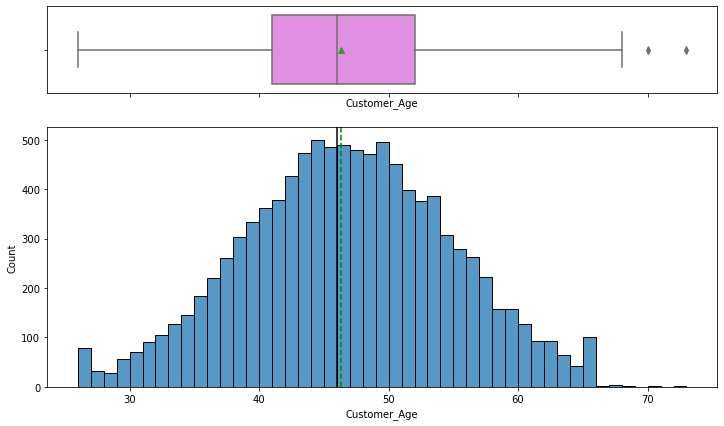

In [104]:
histogram_boxplot(bankb, "Customer_Age")

- data looks like normally distributed
- mean age is arond  45
- we can bin the age into different categories, which might be helpful to understand the correlation with target variable

# Binnig the Age data and changing into Category data

In [105]:
#checking the max 
bankb.Customer_Age.max()

73

In [106]:
#checking the min
bankb.Customer_Age.min()

26

In [107]:
#categorizing into five categories of age using cut function, where 5 bins are used based
bankb["Age_cut"]=pd.cut(bankb.Customer_Age, bins=5, labels=["26 to 35", "36 to 45", "46 to 55", "56 to 65", "66 to 75"])
bankb["Age_cut"]

0        46 to 55
1        46 to 55
2        46 to 55
3        36 to 45
4        36 to 45
           ...   
10122    46 to 55
10123    36 to 45
10124    36 to 45
10125    26 to 35
10126    36 to 45
Name: Age_cut, Length: 10127, dtype: category
Categories (5, object): ['26 to 35' < '36 to 45' < '46 to 55' < '56 to 65' < '66 to 75']

In [108]:
#Changing into category
bankb["Age_cut"]= pd.Categorical(bankb["Age_cut"])

# Observation on Months on Book

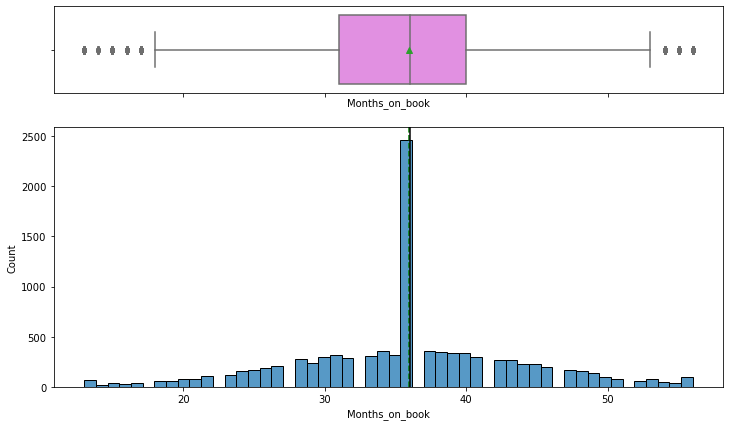

In [109]:
histogram_boxplot(bankb, "Months_on_book")

- There are outliers. It seems the outliers have impact on the mean of the data. Because mean is very much different than the rest of data

# Observation on Total_Revolving_Bal

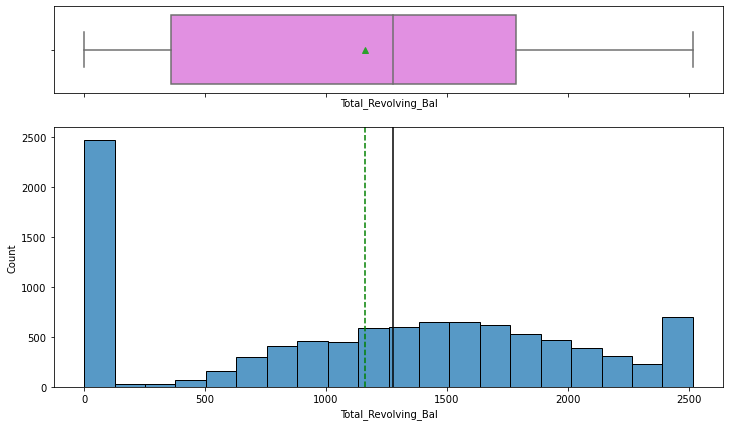

In [110]:
histogram_boxplot(bankb, "Total_Revolving_Bal")

- The most have almost 0 revolving balance 
- Otherwise on average customer have revolving balance between 1000 and 1500

# Observation on Avg_Open_To_Buy

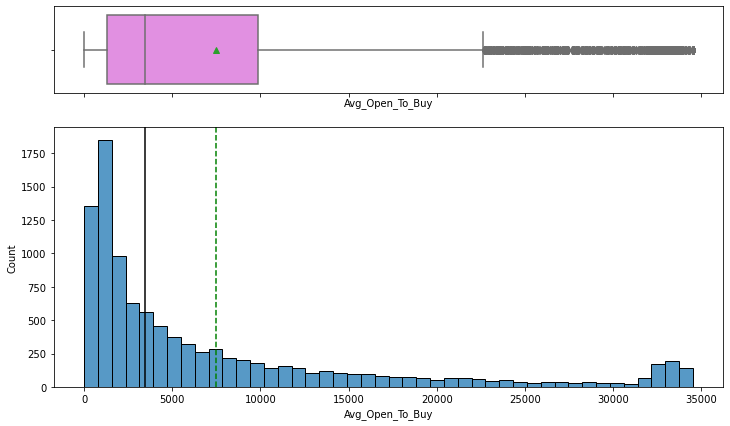

In [111]:
histogram_boxplot(bankb, "Avg_Open_To_Buy")

- there are significant outliers
- the data is highly right skewed

# Observation on Total_Trans_Ct

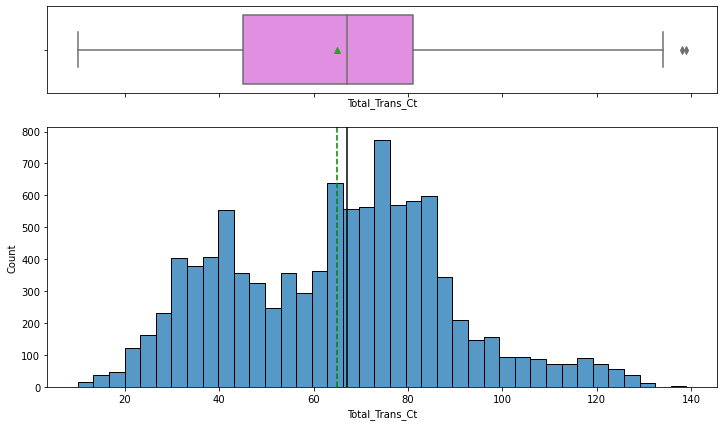

In [112]:
histogram_boxplot(bankb, "Total_Trans_Ct")

- Data almost looks like almost normal
- mean and media centered around 60 times tracsection

# Observation on Total Transection Amount

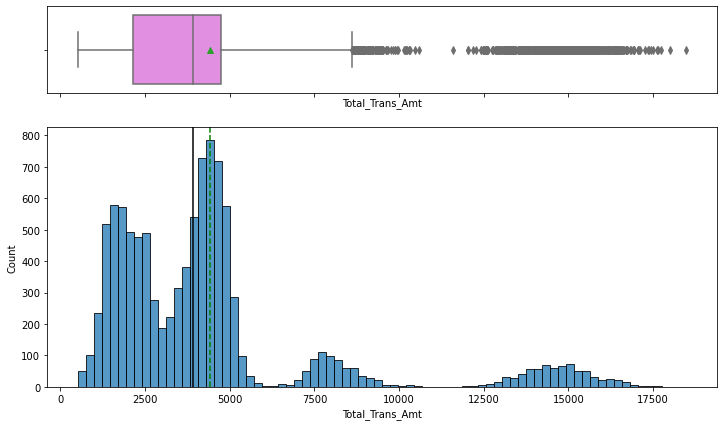

In [113]:
histogram_boxplot(bankb, "Total_Trans_Amt")

- there also data suffers from huge outliers

# Observation on Total_Ct_Chng_Q4_Q1

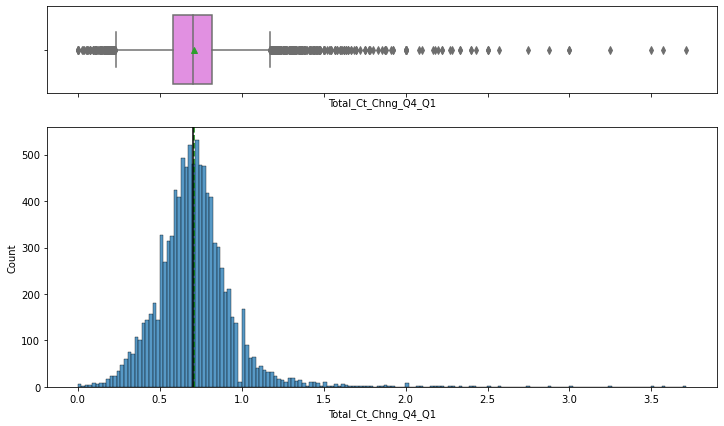

In [114]:
histogram_boxplot(bankb, "Total_Ct_Chng_Q4_Q1")

- Though the distribution of the data looks like normal distribution, however here also data suffers from higly by outliers

# Observation on Total_Amt_Chng_Q4_Q1

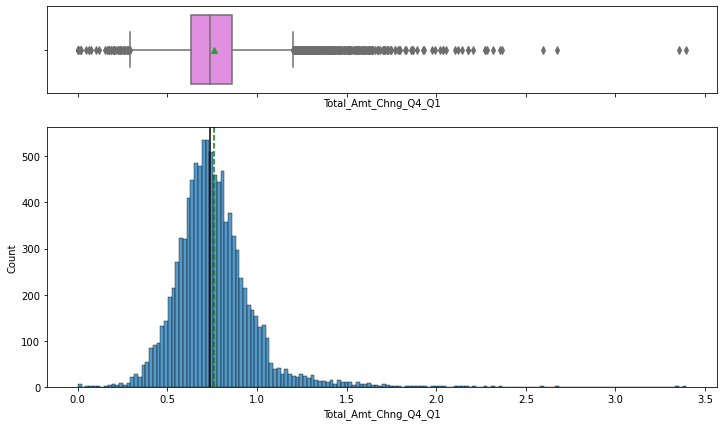

In [115]:
histogram_boxplot(bankb, "Total_Amt_Chng_Q4_Q1")

- Also data suffers from higly outliers, though the distribution looks like normal distribution

# Observation on Avg_Utilization_Ratio

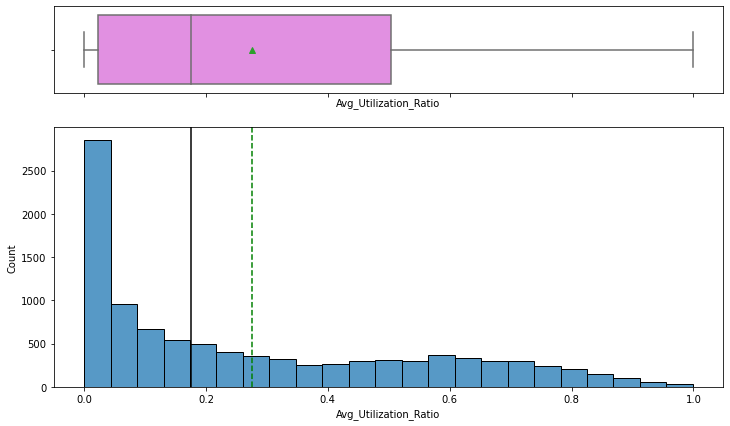

In [116]:
histogram_boxplot(bankb, "Avg_Utilization_Ratio")

- The average usage is ratio is not satisfactory. 
- the customers use only around 20 percent of available credit

# Observation on Credit_Limit

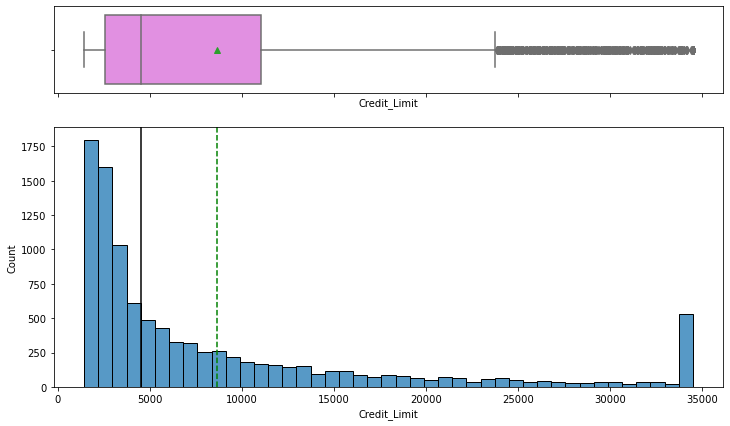

In [117]:
histogram_boxplot(bankb, "Credit_Limit")

- The data distribution are highly right skewed
- Data suffers from huge outliers
- Mean customers have around 5000 dollars credit limit

In [118]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

# Observation on Gender

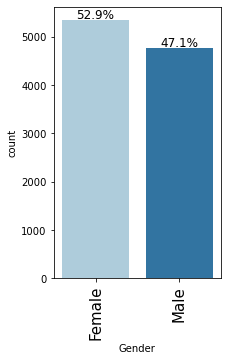

In [119]:
labeled_barplot(bankb, "Gender", perc=True)

- Male and Female ratio is almost similer
- The number of females are little higher than male customer

# Observation on Education_Level

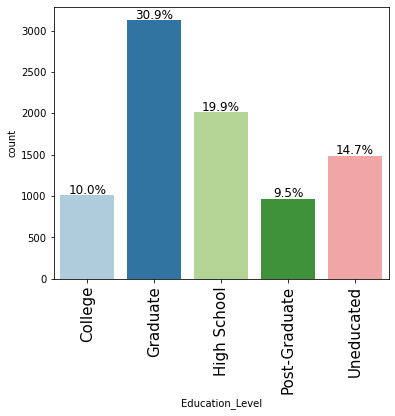

In [120]:
labeled_barplot(bankb, "Education_Level", perc=True)

- 30 percent of customer are graduate
- 9.5 prcent customer are post graduate, which are expected

# Observation on Dependent_count

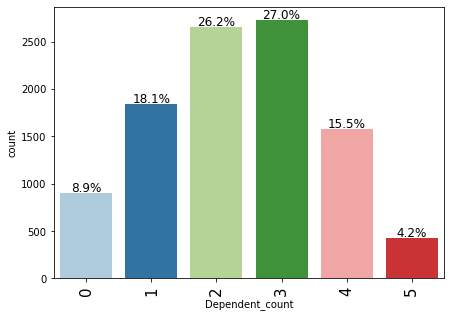

In [121]:
labeled_barplot(bankb, "Dependent_count", perc=True)

- 27 percent of customers have 3 depedents
- 4.2 percent customers have 5 dependents

# Observation on Marital_Status

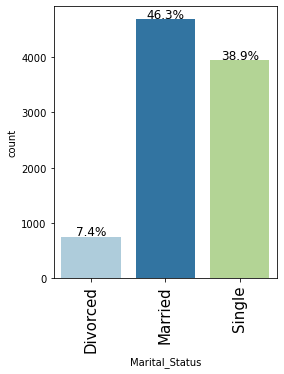

In [122]:
labeled_barplot(bankb, "Marital_Status", perc=True)

- 46 percent are married
- 38 percent are single
- 7 percent are divorced

# Observation on Income_Category

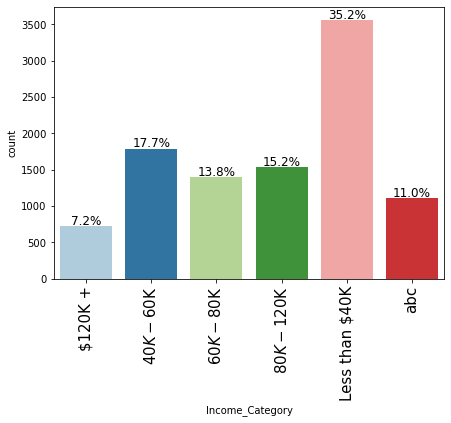

In [123]:
labeled_barplot(bankb, "Income_Category", perc=True)

- Most of the customer 35.2 percent have income less than 40 K
- 7.2 percent customer have income more than 120K
- There is one label is abc
- it can be assumed, they are the customer, who were unwilling to express their income, that is labeled as abc

# Observation on Card_Category

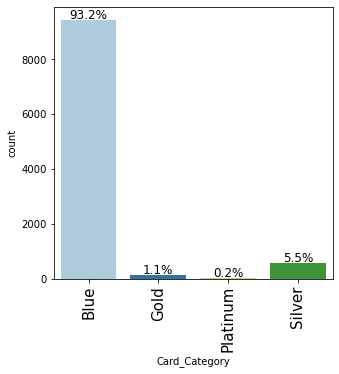

In [124]:
labeled_barplot(bankb, "Card_Category", perc=True)

- 93.2 percent customer use the blue card, most basic one
- there is one clear indication, the bank should target more diversified customer profile

# Observation on Total_Relationship_Count

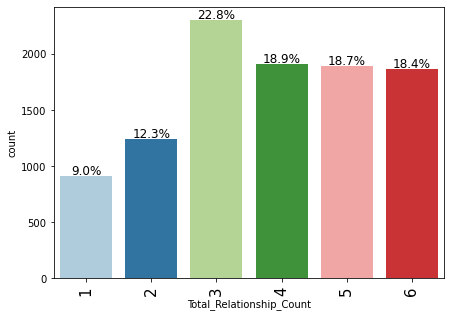

In [125]:
labeled_barplot(bankb,"Total_Relationship_Count", perc=True)

- Highest number of customers, around 22.8 percent have 3 products
- Hier looks like the distribution of other categories almost similar

# Observation on Months_Inactive_12_mon

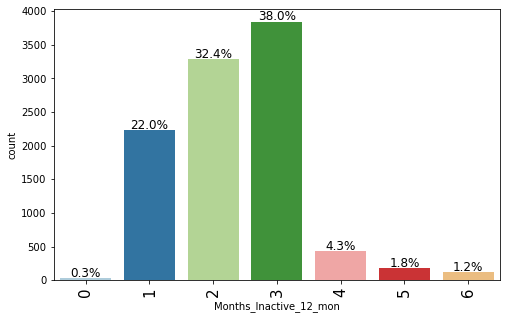

In [126]:
labeled_barplot(bankb, "Months_Inactive_12_mon", perc=True)

- 38 percent of customers are inactive for 3 months
- 32 percent of customers are inactive for 2 months
- Most of the customers are more or less inactive

# Observation on Contacts_Count_12_mon

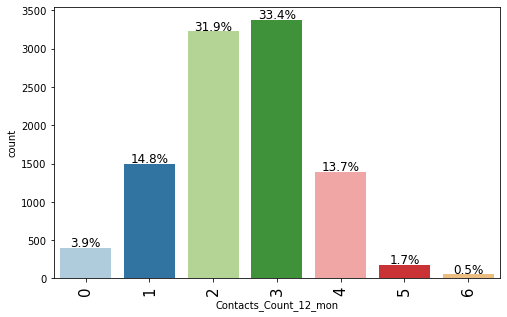

In [127]:
labeled_barplot(bankb, "Contacts_Count_12_mon", perc=True)

- 33 percent of customer have tree times contact with the bank
- and the second highest is the 32 percent customer have 2 times contact
- Most of the customers are in contact with the bank

# Bivariate Analysis

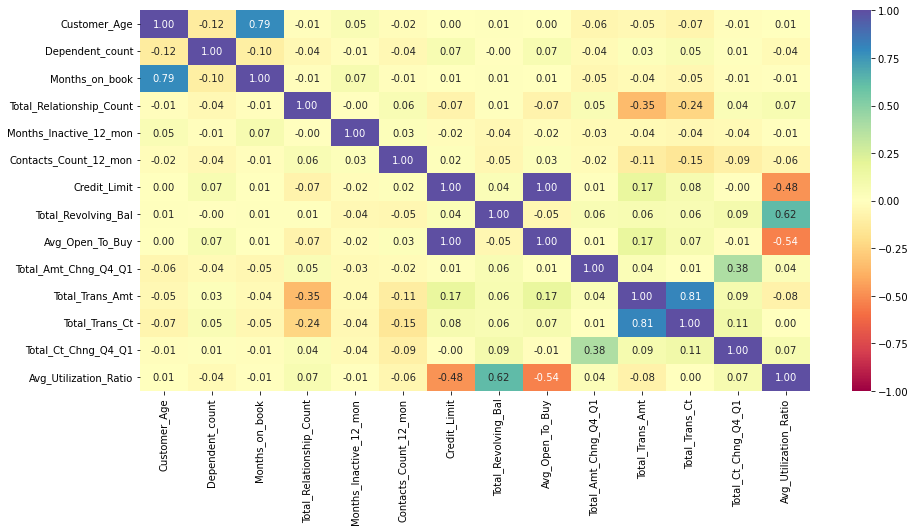

In [37]:
#Plotting the heatmap based on correlation between data
plt.figure(figsize=(15,7))
sns.heatmap(banka.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

- Total_Trans_Amt and Total_Trans_Ct are highly correlated
- There is good correlation between Months_on_book and Customer_Age
- In classification problem, high correlation does not have impact
- There is negative relationship between variables Avg_utlization_ratio and Avg_open_to_buy, which makes also sense
- Avg_open_to_buy and creditlimit are highly corelated

In [128]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

# Gender VS Attrition_Flag

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
Female                        930               4428   5358
Male                          697               4072   4769
------------------------------------------------------------------------------------------------------------------------


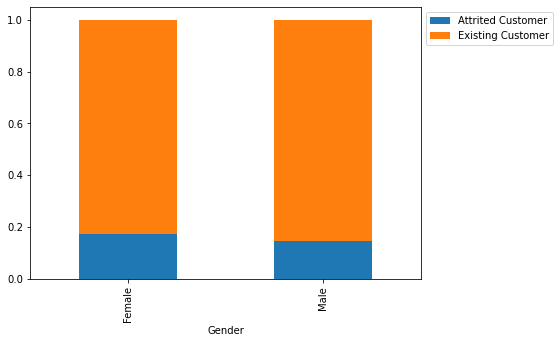

In [129]:
stacked_barplot(bankb, "Gender", "Attrition_Flag")

- There is no significant change based on gender
- both are alsmot similar in behavior

In [ ]:
# Education_Level VS Attrition_Flag

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
Post-Graduate                  187                780   967
College                        154                859  1013
------------------------------------------------------------------------------------------------------------------------


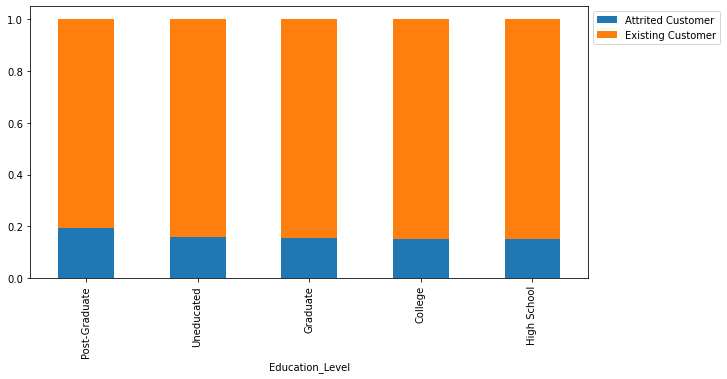

In [130]:
stacked_barplot(bankb, "Education_Level", "Attrition_Flag")

In [ ]:
- Interestingly, there is no significant differences based on the education level

# Age_cut vs Attrition_Flag

Attrition_Flag  Attrited Customer  Existing Customer    All
Age_cut                                                    
All                          1627               8500  10127
46 to 55                      716               3626   4342
36 to 45                      527               2729   3256
56 to 65                      246               1210   1456
26 to 35                      122                797    919
66 to 75                       16                138    154
------------------------------------------------------------------------------------------------------------------------


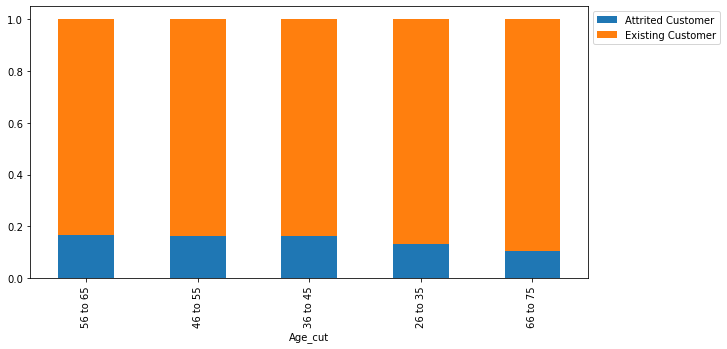

In [131]:
stacked_barplot(bankb,"Age_cut", "Attrition_Flag")

- By Age also there is no significant impact on customer behavior

# Marital_Status vs Attrition_Flag

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


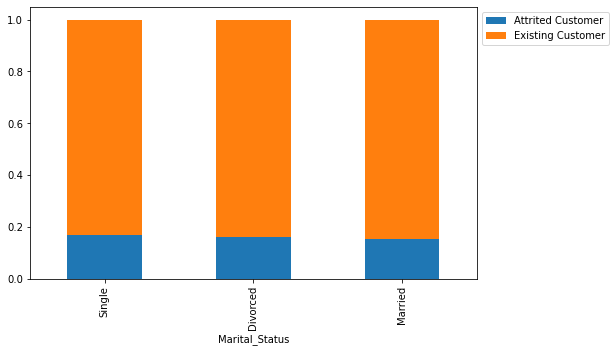

In [132]:
stacked_barplot(bankb, "Marital_Status", "Attrition_Flag")

- By martial Status also categoris have no impact on target variable

# Income Category VS Attrition_flag

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


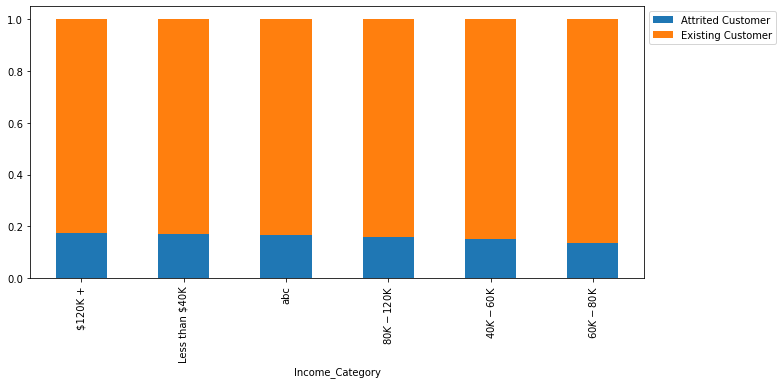

In [71]:
stacked_barplot(bankb, "Income_Category", "Attrition_Flag")

- The behavior of target variable also do not differ by the categories of income level

# Card_Category VS Attrition_Flag

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


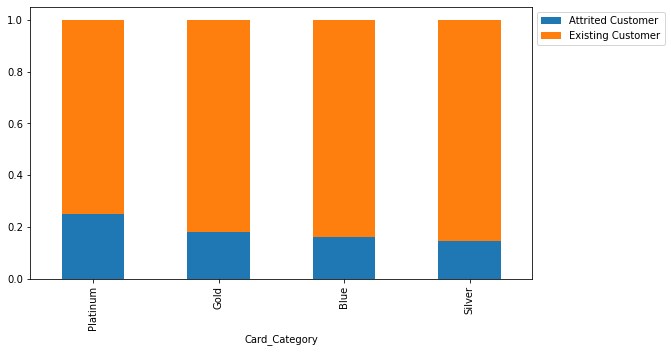

In [133]:
stacked_barplot(bankb, "Card_Category", "Attrition_Flag")

- Platinum Customer are leaving the bank mostly
- that might be a significant indicator, that bank are not attractive for the attractive customer
- there mght be lacking in service, proper targeting of the cusotmer

# Observations from Univariate and Bivariate Analysis
- Age are normally distributed
- Percentage of female and male customers are almost same
- Most of the customer have completed their graduation
- Most of the customer have 2 to 3 dependents
- Most of the customers are either married or single
- Highest percentage of customer have income below 40 thousand
- Most of the customer use the basic credit card from the bank
- Most customers around 80 percent inactive from 1 to 3 months
- Around 70 percent of customer have the contact with bank yearly from 2 to 3 times
- Many features are suffering from outliers, like in Credit_limit, Avg_open_to_buy, Total_trans_amt-Total trans_ct
- Demographich varaibles age, gender, marital status, Income level has no or significant impact on the behavior of customer, whether customer will stay or not
- Platinum customers are leaving. that might be indication of dissatisfaction with the bank and their service
- Bank might have targeting of right segement for their business and designing the service accordingly
- Total_Trans_Amt and Total_Trans_Ct are highly correlated
- There is good correlation between Months_on_book and Customer_Age
- There is negative relationship between variables Avg_utlization_ratio and Avg_open_to_buy, which makes also sense
- Avg_open_to_buy and creditlimit are highly corelated

# Data Cleaning, Feature Engineering

In [134]:
#replacing the abc values with mode values, Less than 40K of Income category
bankb.Income_Category=bankb.Income_Category.replace("abc", "Less than $40K")

In [135]:
#Using the label encoding to replace labels
column_str={
    "Education_Level": {"Uneducated": 1, "High School": 2, "College": 3, "Graduate": 4, "Post-Graduate": 5},
    "Card_Category": {"Blue": 1, "Silver": 2, "Gold": 3, "Platinum": 4},
    "Income_Category": {"Less than $40K": 1, "$40K - $60K": 2, "$60K - $80K": 3, "$80K - $120K": 4, "$120K +": 5},
}

In [136]:
bankb=bankb.replace(column_str)

In [137]:
#Converting the numerical data of target variable
replace_str= {
    "Attrition_Flag": {"Existing Customer":0, "Attrited Customer":1}
}

In [138]:
bankb=bankb.replace(replace_str)

In [139]:
#Dropping the CLientnum and Customer_Age columns, as age is already binned into five categories, thats why this column is redaundant
bankb=bankb.drop(["Customer_Age", "CLIENTNUM"], axis=1)

# Splitt the data set into train, validation and test set

In [140]:
#dividing the data into Xand Y
X = bankb.drop(["Attrition_Flag"], axis=1)
y = bankb.pop("Attrition_Flag")

In [141]:
#splitting the data into test and temporary data sets
X_temp, X_test, y_temp, y_test=train_test_split(X, y, test_size=0.30, random_state=1, stratify=y)

In [142]:
#splittig the dataset into train and validation
X_train, X_val, y_train, y_val=train_test_split(X_temp, y_temp, test_size=0.30, random_state=1, stratify=y_temp)

In [143]:
X_train=pd.get_dummies(X_train, drop_first=True)

In [144]:
X_val=pd.get_dummies(X_val, drop_first=True)

In [145]:
X_test=pd.get_dummies(X_test, drop_first=True)

In [146]:
print(X_train.shape, X_val.shape, X_test.shape)

(4961, 23) (2127, 23) (3039, 23)


In [163]:
#replacing the missing values in Education_level with mode
X_train['Education_Level'] = X_train['Education_Level'].fillna(X_train['Education_Level'].mode()[0])

In [171]:
X_val["Education_Level"] = X_val["Education_Level"].fillna(X_val['Education_Level'].mode()[0])

In [275]:
X_test["Education_Level"] = X_test["Education_Level"].fillna(X_test['Education_Level'].mode()[0])

# Trying different models using different classifier

In [ ]:
##Function to create different metrics score
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and validation results
    score_list=[] 
    
    #Predicting on train and validation
    pred_train = model.predict(X_train)
    pred_val = model.predict(X_val)
    
    #Accuracy of the model
    train_acc = model.score(X_train,y_train)
    val_acc = model.score(X_val,y_val)
    
    #Recall of the model
    train_recall = metrics.recall_score(y_train,pred_train)
    val_recall = metrics.recall_score(y_val,pred_val)
    
    #Precision of the model
    train_precision = metrics.precision_score(y_train,pred_train)
    val_precision = metrics.precision_score(y_val,pred_val)
    
    #f1 score of the model
    train_f1 = metrics.f1_score(y_train,pred_train)
    val_f1 = metrics.f1_score(y_val,pred_val)
    
    score_list.extend((train_acc,val_acc,train_recall,val_recall,train_precision,val_precision, train_f1, val_f1))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on validation set : ",model.score(X_val,y_val))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on validation set : ",metrics.recall_score(y_val,pred_val))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on validation set : ",metrics.precision_score(y_val,pred_val))
        print("f1 on training set : ",metrics.f1_score(y_train,pred_train))
        print("f1 on validation set : ",metrics.f1_score(y_val,pred_val))
    
    return score_list # returning the list with train and test scores

In [178]:
## Function to create confusion matrix
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

# Which will be the best Score?

- This bank wants to know and identify them who is going to leave them, so that they know the reasons, and design their future services properly to retain the customers
- So in this case the attrited customer is defined 1. We will target to identify the customer who will leave, on the other hand will try to reduce false negative, whom we have considered, that they will stay but they didn't stay
- Our focus will be on recall, as well as on F1

# Logistic regression

In [173]:
lr=LogisticRegression(random_state=1)

In [174]:
lr.fit(X_train, y_train)

LogisticRegression(random_state=1)

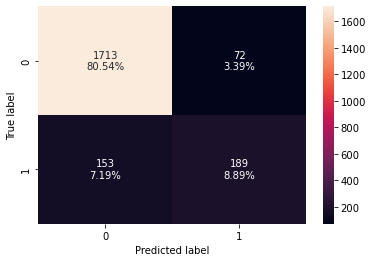

In [179]:
confusion_matrix_sklearn(lr, X_val, y_val)

-Accuracy and precision scores both are good and also the gap between train and test are not so big
- However the recall and F1 score are not good
- Our model couldn't predict false negative around 8 percent 

In [175]:
get_metrics_score(lr)

Accuracy on training set :  0.8915541221527917
Accuracy on validation set :  0.8942172073342737
Recall on training set :  0.5181932245922208
Recall on validation set :  0.5526315789473685
Precision on training set :  0.7283950617283951
Precision on validation set :  0.7241379310344828
f1 on training set :  0.6055718475073314
f1 on validation set :  0.6268656716417911


[0.8915541221527917,
 0.8942172073342737,
 0.5181932245922208,
 0.5526315789473685,
 0.7283950617283951,
 0.7241379310344828,
 0.6055718475073314,
 0.6268656716417911]

# Model using decision tree classifier

In [180]:
dt=DecisionTreeClassifier(random_state=1)

In [181]:
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

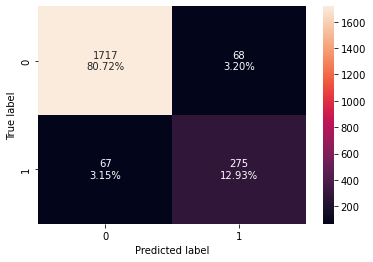

In [182]:
confusion_matrix_sklearn(dt, X_val, y_val)

In [ ]:
-In all categories in train models are suffering from overfitting
- There are gap between train and validation score
- Our model couldn't predict false negative 3 percent, the model has perfomed better interms of predicting false negative

In [59]:
get_metrics_score(dt)

Accuracy on training set :  1.0
Accuracy on validation set :  0.9365303244005642
Recall on training set :  1.0
Recall on validation set :  0.9686274509803922
Precision on training set :  1.0
Precision on validation set :  0.9563053097345132
f1 on training set :  1.0
f1 on validation set :  0.9624269412747007


[1.0,
 0.9365303244005642,
 1.0,
 0.9686274509803922,
 1.0,
 0.9563053097345132,
 1.0,
 0.9624269412747007]

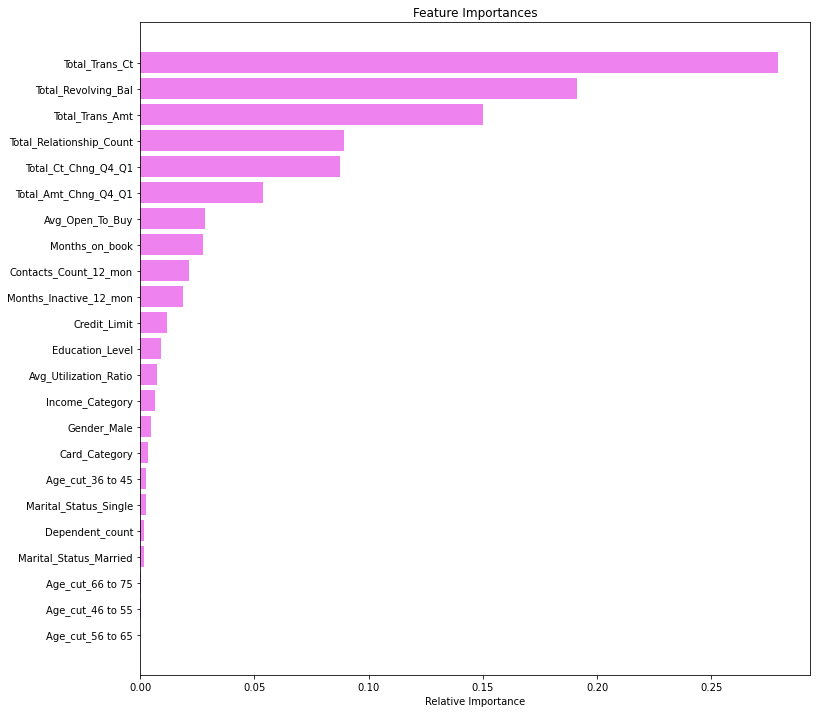

In [282]:
importances = dt.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Model using Random Forest Classifier

In [183]:
rf=RandomForestClassifier(random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

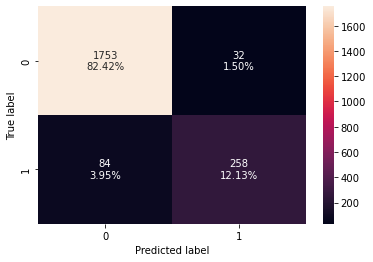

In [185]:
confusion_matrix_sklearn(rf, X_val, y_val)

- Here also model is suffering from overfitting,
- gap between train and validation is high
- predicting false negative little worse than decision tree model

In [184]:
get_metrics_score(rf)

Accuracy on training set :  1.0
Accuracy on validation set :  0.9454630935590033
Recall on training set :  1.0
Recall on validation set :  0.7543859649122807
Precision on training set :  1.0
Precision on validation set :  0.8896551724137931
f1 on training set :  1.0
f1 on validation set :  0.8164556962025318


[1.0,
 0.9454630935590033,
 1.0,
 0.7543859649122807,
 1.0,
 0.8896551724137931,
 1.0,
 0.8164556962025318]

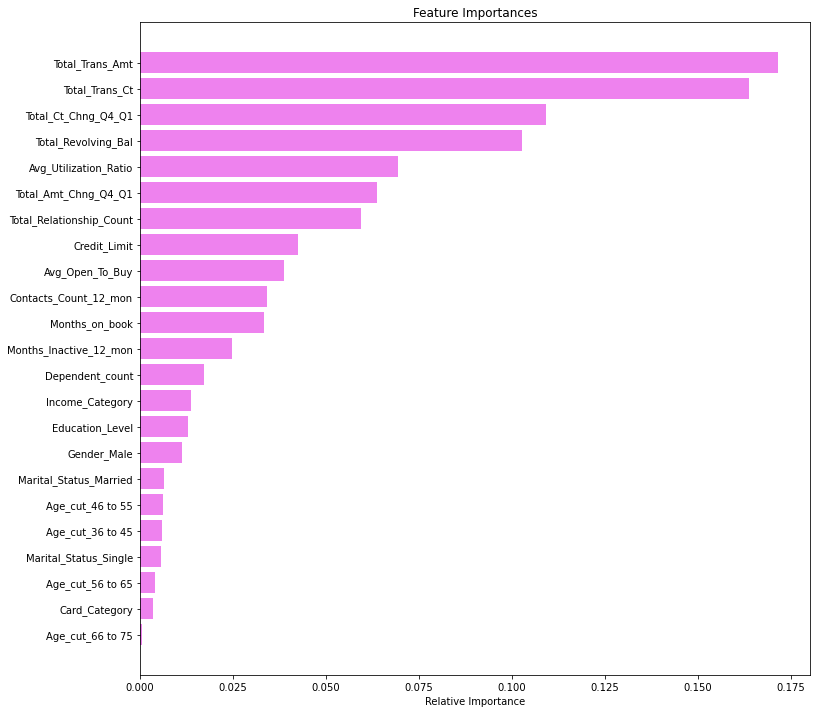

In [283]:
importances = rf.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Model using Bagging Classifer

In [186]:
bg=BaggingClassifier(random_state=1)
bg.fit(X_train, y_train)

BaggingClassifier(random_state=1)

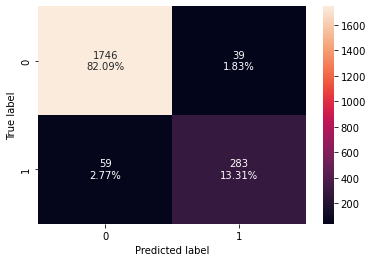

In [188]:
confusion_matrix_sklearn(bg, X_val, y_val)

- Hier overall performance has increased in all categories
- though still the gap between train and validation is little high, specially in recall, precision and F1
- model has done better predicting false negative

In [187]:
get_metrics_score(bg)

Accuracy on training set :  0.9961701269905261
Accuracy on validation set :  0.9539257169722614
Recall on training set :  0.9799247176913425
Recall on validation set :  0.827485380116959
Precision on training set :  0.9961734693877551
Precision on validation set :  0.8788819875776398
f1 on training set :  0.9879822896900696
f1 on validation set :  0.8524096385542169


[0.9961701269905261,
 0.9539257169722614,
 0.9799247176913425,
 0.827485380116959,
 0.9961734693877551,
 0.8788819875776398,
 0.9879822896900696,
 0.8524096385542169]

# Model Using AdaBoost

In [189]:
ad=AdaBoostClassifier(random_state=1)
ad.fit(X_train, y_train)

AdaBoostClassifier(random_state=1)

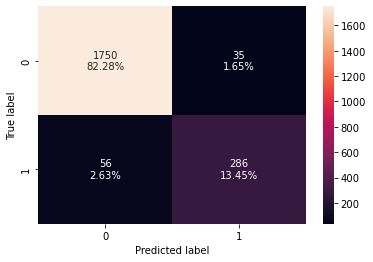

In [191]:
confusion_matrix_sklearn(ad, X_val, y_val)

- Our adaboost model has performed very well in all metrics score categories
- Also percentage of false negative has decreased

In [190]:
get_metrics_score(ad)

Accuracy on training set :  0.9548478129409393
Accuracy on validation set :  0.9572167371885284
Recall on training set :  0.8180677540777918
Recall on validation set :  0.8362573099415205
Precision on training set :  0.8919288645690835
Precision on validation set :  0.8909657320872274
f1 on training set :  0.8534031413612565
f1 on validation set :  0.8627450980392156


[0.9548478129409393,
 0.9572167371885284,
 0.8180677540777918,
 0.8362573099415205,
 0.8919288645690835,
 0.8909657320872274,
 0.8534031413612565,
 0.8627450980392156]

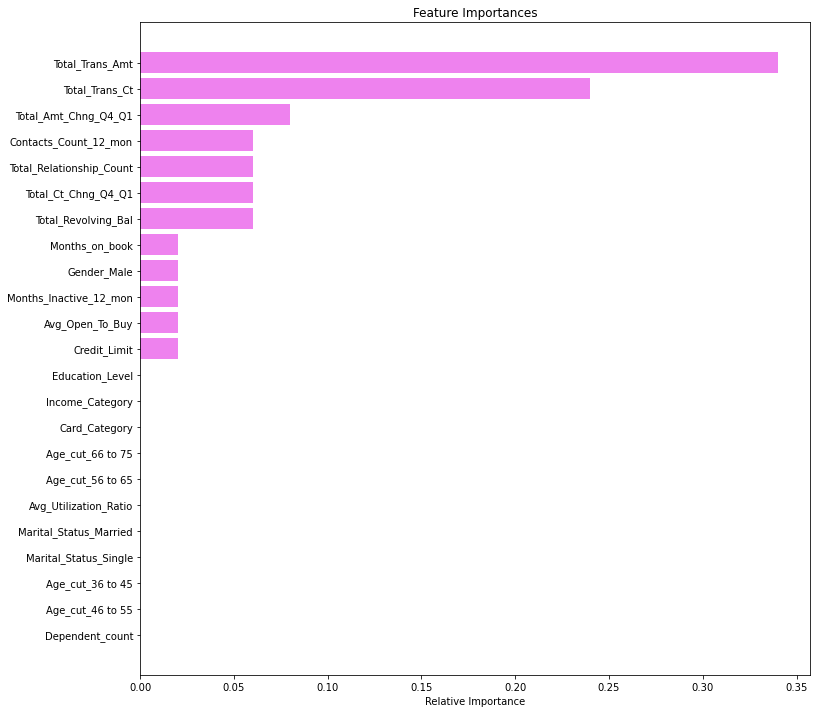

In [285]:
importances = ad.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Model using Gradient

In [192]:
gb=GradientBoostingClassifier(random_state=1)
gb.fit(X_train, y_train)

GradientBoostingClassifier(random_state=1)

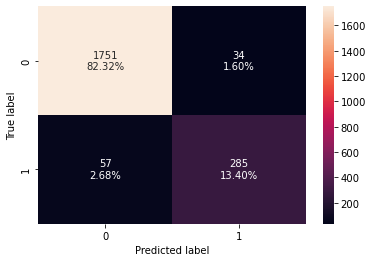

In [194]:
confusion_matrix_sklearn(gb, X_val, y_val)

- Gradient boosting has perfomed little bit lower than ada boost model
- predicting the false negative performence almost similar like ada boost

In [193]:
get_metrics_score(gb)

Accuracy on training set :  0.9746018947792784
Accuracy on validation set :  0.9572167371885284
Recall on training set :  0.8808030112923463
Recall on validation set :  0.8333333333333334
Precision on training set :  0.9577080491132333
Precision on validation set :  0.8934169278996865
f1 on training set :  0.9176470588235293
f1 on validation set :  0.8623298033282906


[0.9746018947792784,
 0.9572167371885284,
 0.8808030112923463,
 0.8333333333333334,
 0.9577080491132333,
 0.8934169278996865,
 0.9176470588235293,
 0.8623298033282906]

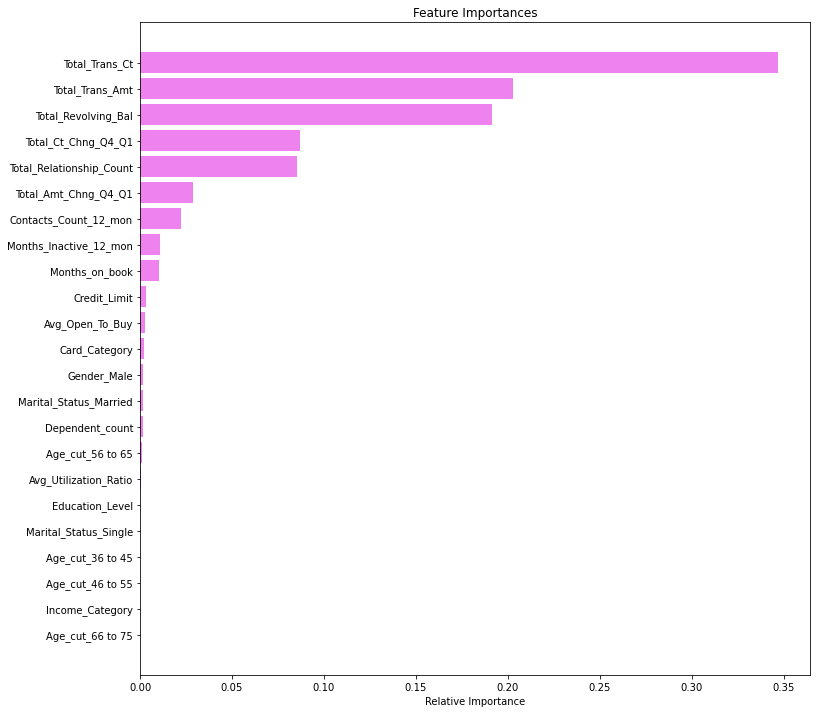

In [280]:
importances = gb.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Oversampling using SMOT

In [195]:
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)

In [196]:
X_train_over, y_train_over=sm.fit_resample(X_train, y_train)

# Applying SMOT on Logistic Regression

In [197]:
lr1 = LogisticRegression(random_state=1)
lr1.fit(X_train_over, y_train_over)

LogisticRegression(random_state=1)

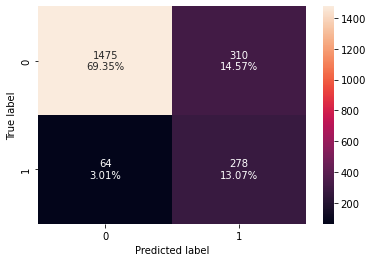

In [198]:
confusion_matrix_sklearn(lr1, X_val, y_val)

- Oversampled regression model has performed poor in precision and F1
- However in accuracy performed well

In [199]:
get_metrics_score(lr1)

Accuracy on training set :  0.8256399919371095
Accuracy on validation set :  0.8241654913023038
Recall on training set :  0.8017565872020075
Recall on validation set :  0.8128654970760234
Precision on training set :  0.47473997028231796
Precision on validation set :  0.47278911564625853
f1 on training set :  0.5963602426504899
f1 on validation set :  0.5978494623655914


[0.8256399919371095,
 0.8241654913023038,
 0.8017565872020075,
 0.8128654970760234,
 0.47473997028231796,
 0.47278911564625853,
 0.5963602426504899,
 0.5978494623655914]

# Applying SMOT on Decision Tree

In [200]:
dt1=DecisionTreeClassifier(random_state=1)
dt1.fit(X_train_over, y_train_over)

DecisionTreeClassifier(random_state=1)

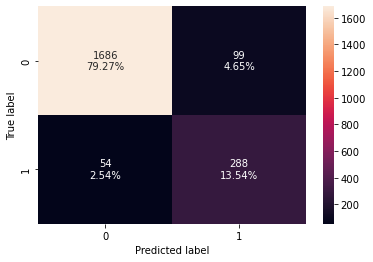

In [202]:
confusion_matrix_sklearn(dt1, X_val, y_val)

- The model is suffering from overfitting as expected in decision tree
- false negative is reduced

In [201]:
get_metrics_score(dt1)

Accuracy on training set :  1.0
Accuracy on validation set :  0.9280677009873061
Recall on training set :  1.0
Recall on validation set :  0.8421052631578947
Precision on training set :  1.0
Precision on validation set :  0.7441860465116279
f1 on training set :  1.0
f1 on validation set :  0.7901234567901234


[1.0,
 0.9280677009873061,
 1.0,
 0.8421052631578947,
 1.0,
 0.7441860465116279,
 1.0,
 0.7901234567901234]

# Applying SMOT on Random Forest

In [203]:
rf1=RandomForestClassifier(random_state=1)
rf1.fit(X_train_over, y_train_over)

RandomForestClassifier(random_state=1)

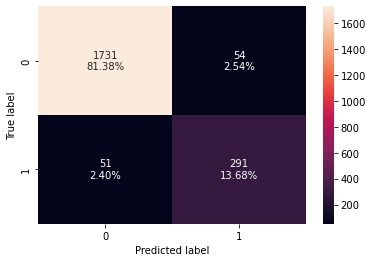

In [205]:
confusion_matrix_sklearn(rf1, X_val, y_val)

- this model also suffers from overfitting
- However scored well in all metrics categories
- False negaative is further reduced

In [204]:
get_metrics_score(rf1)

Accuracy on training set :  1.0
Accuracy on validation set :  0.9506346967559943
Recall on training set :  1.0
Recall on validation set :  0.8508771929824561
Precision on training set :  1.0
Precision on validation set :  0.8434782608695652
f1 on training set :  1.0
f1 on validation set :  0.8471615720524017


[1.0,
 0.9506346967559943,
 1.0,
 0.8508771929824561,
 1.0,
 0.8434782608695652,
 1.0,
 0.8471615720524017]

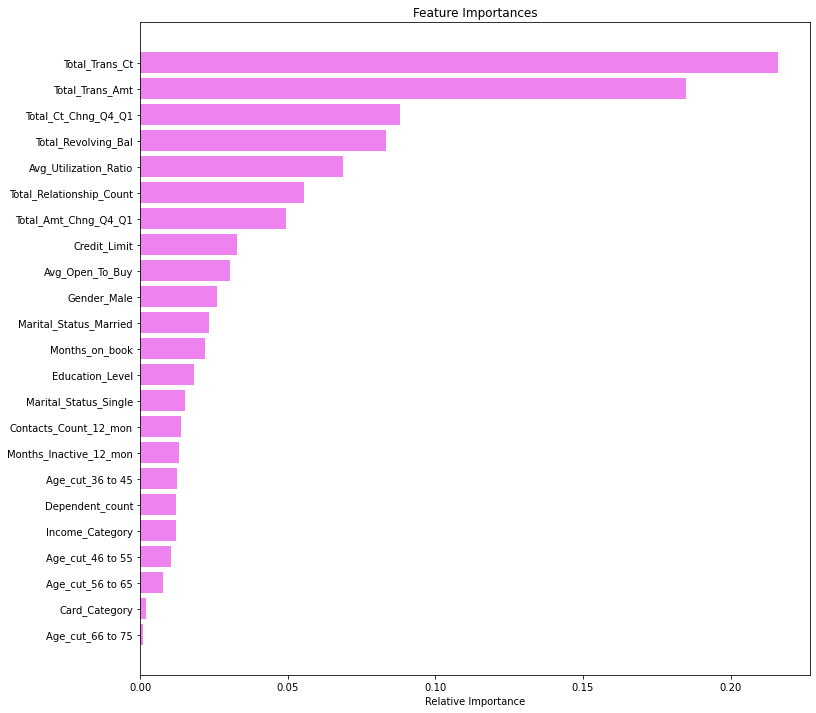

In [287]:
importances = rf1.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Applying SMOT on Bagging

In [206]:
bg1=BaggingClassifier(random_state=1)
bg1.fit(X_train_over, y_train_over)

BaggingClassifier(random_state=1)

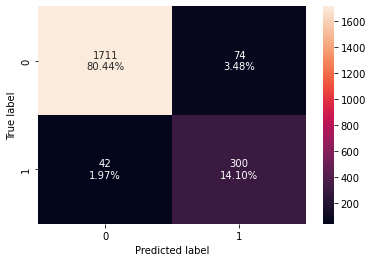

In [208]:
confusion_matrix_sklearn(bg1, X_val, y_val)

- this bagging oversampled also suffering from overfitting
- gap between train and val is higher
- however performed well in predicting the negative

In [207]:
get_metrics_score(bg1)

Accuracy on training set :  0.9979842773634348
Accuracy on validation set :  0.9454630935590033
Recall on training set :  0.9949811794228356
Recall on validation set :  0.8771929824561403
Precision on training set :  0.9924906132665833
Precision on validation set :  0.8021390374331551
f1 on training set :  0.993734335839599
f1 on validation set :  0.8379888268156425


[0.9979842773634348,
 0.9454630935590033,
 0.9949811794228356,
 0.8771929824561403,
 0.9924906132665833,
 0.8021390374331551,
 0.993734335839599,
 0.8379888268156425]

# Applying SMOT on AdaBoost

In [209]:
ad1=AdaBoostClassifier(random_state=1)
ad1.fit(X_train_over, y_train_over)

AdaBoostClassifier(random_state=1)

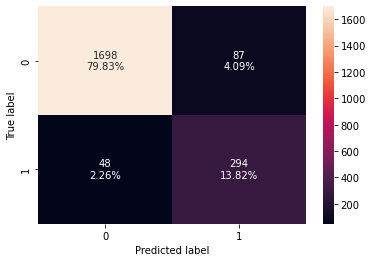

In [211]:
confusion_matrix_sklearn(ad1, X_val, y_val)

- Adaboost oversamoled has performed well in all metrics categories
- Also it performed well in predctive negatives

In [210]:
get_metrics_score(ad1)

Accuracy on training set :  0.941544043539609
Accuracy on validation set :  0.9365303244005642
Recall on training set :  0.8845671267252195
Recall on validation set :  0.8596491228070176
Precision on training set :  0.7807308970099668
Precision on validation set :  0.7716535433070866
f1 on training set :  0.8294117647058824
f1 on validation set :  0.8132780082987552


[0.941544043539609,
 0.9365303244005642,
 0.8845671267252195,
 0.8596491228070176,
 0.7807308970099668,
 0.7716535433070866,
 0.8294117647058824,
 0.8132780082987552]

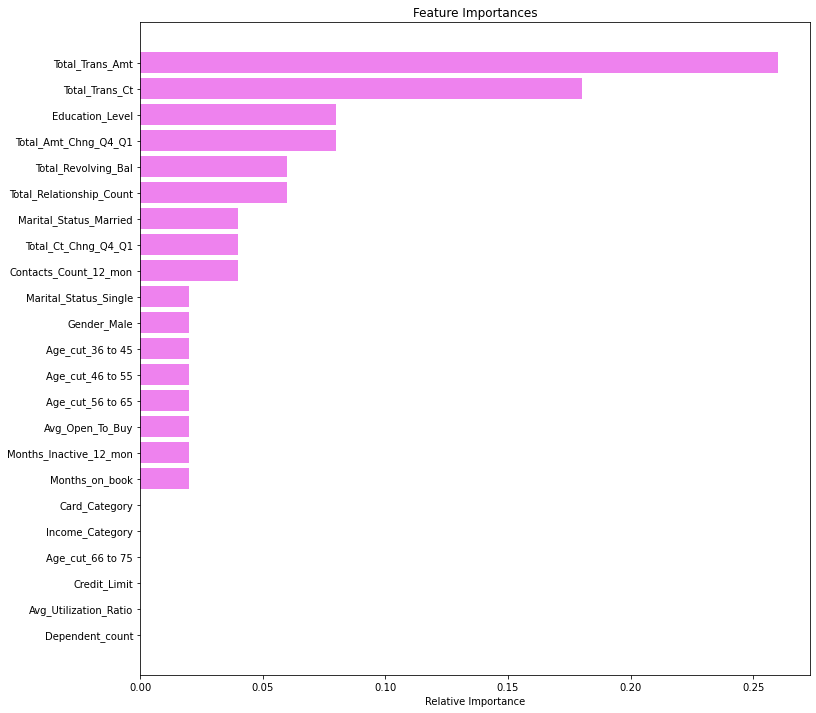

In [288]:
importances = ad1.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Applying SMOT on Gradientboosting

In [212]:
gb1=GradientBoostingClassifier(random_state=1)
gb1.fit(X_train_over, y_train_over)

GradientBoostingClassifier(random_state=1)

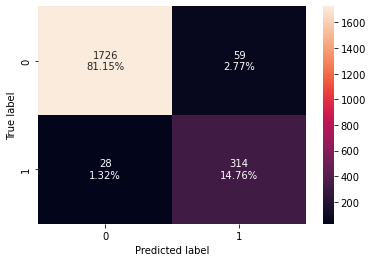

In [214]:
confusion_matrix_sklearn(gb1, X_val, y_val)

- Gradient boosting has performed even better than ada
- the percentage in false negative the most minimum among all models

In [213]:
get_metrics_score(gb1)

Accuracy on training set :  0.9665390042330175
Accuracy on validation set :  0.9590973201692524
Recall on training set :  0.9297365119196989
Recall on validation set :  0.9181286549707602
Precision on training set :  0.8707403055229143
Precision on validation set :  0.8418230563002681
f1 on training set :  0.8992718446601942
f1 on validation set :  0.8783216783216784


[0.9665390042330175,
 0.9590973201692524,
 0.9297365119196989,
 0.9181286549707602,
 0.8707403055229143,
 0.8418230563002681,
 0.8992718446601942,
 0.8783216783216784]

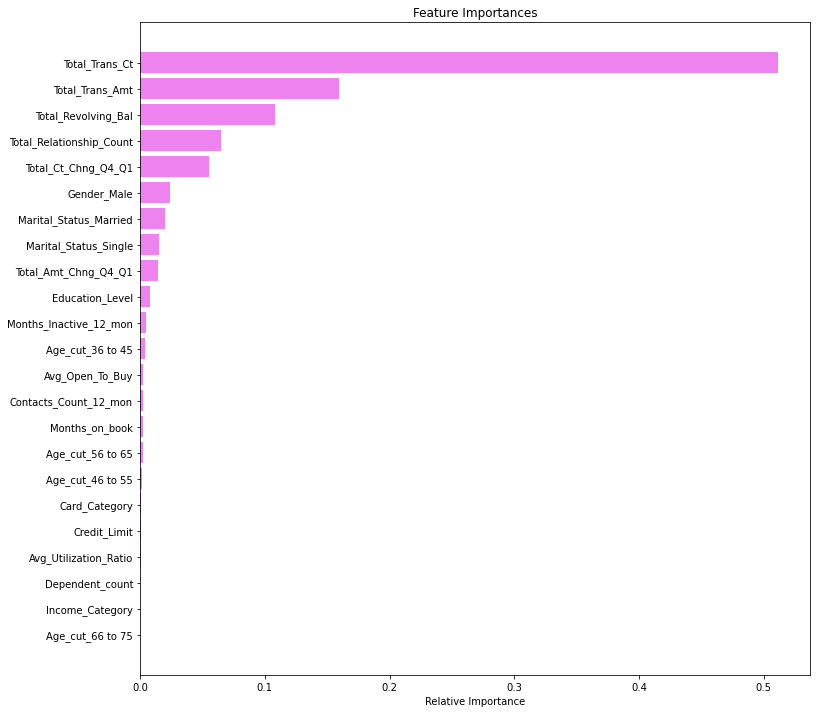

In [289]:
importances = gb1.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Undersmapling using Randomundersampler

In [215]:
ru=RandomUnderSampler(random_state=1)
X_train_un, y_train_un=ru.fit_resample(X_train, y_train)

# Logisticregression using RandomUnderSampler

In [216]:
lr2=LogisticRegression(random_state=1)
lr2.fit(X_train_un, y_train_un)

LogisticRegression(random_state=1)

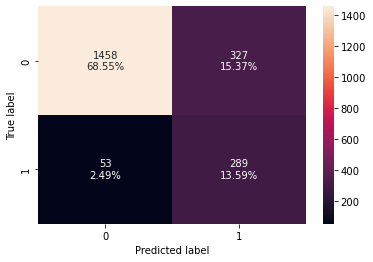

In [218]:
confusion_matrix_sklearn(lr2, X_val, y_val)

- Upsampled model performed very poorly in all measurement score

In [217]:
get_metrics_score(lr2)

Accuracy on training set :  0.8157629510179399
Accuracy on validation set :  0.8213446168312176
Recall on training set :  0.8343789209535759
Recall on validation set :  0.8450292397660819
Precision on training set :  0.45957152729785766
Precision on validation set :  0.46915584415584416
f1 on training set :  0.5926916221033869
f1 on validation set :  0.6033402922755742


[0.8157629510179399,
 0.8213446168312176,
 0.8343789209535759,
 0.8450292397660819,
 0.45957152729785766,
 0.46915584415584416,
 0.5926916221033869,
 0.6033402922755742]

# Decision Tree using RandomUnderSampler

In [219]:
dt2=DecisionTreeClassifier(random_state=1)
dt2.fit(X_train_un, y_train_un)

DecisionTreeClassifier(random_state=1)

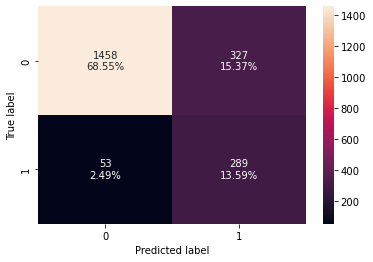

In [221]:
confusion_matrix_sklearn(lr2, X_val, y_val)

- decision tree upsampled has also performed poorly than other models

In [220]:
get_metrics_score(dt2)

Accuracy on training set :  0.9163475105825438
Accuracy on validation set :  0.8782322519981194
Recall on training set :  1.0
Recall on validation set :  0.9239766081871345
Precision on training set :  0.6575907590759076
Precision on validation set :  0.575591985428051
f1 on training set :  0.7934295669487307
f1 on validation set :  0.7093153759820426


[0.9163475105825438,
 0.8782322519981194,
 1.0,
 0.9239766081871345,
 0.6575907590759076,
 0.575591985428051,
 0.7934295669487307,
 0.7093153759820426]

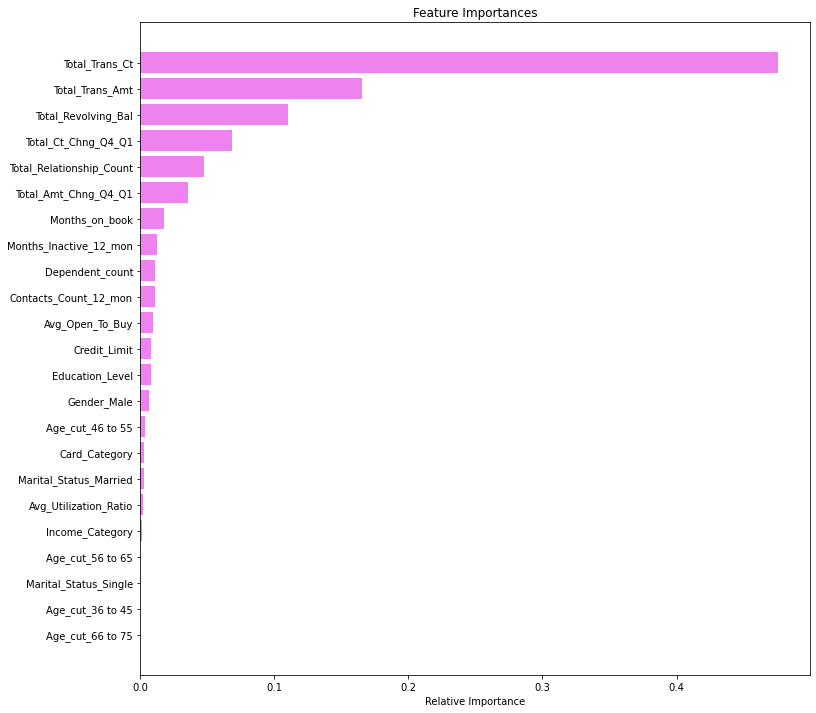

In [290]:
importances = dt2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Random Forest using RandomUnderSampler

In [222]:
rf2=RandomForestClassifier(random_state=1)
rf2.fit(X_train_un, y_train_un)

RandomForestClassifier(random_state=1)

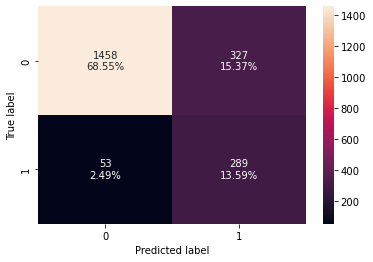

In [224]:
confusion_matrix_sklearn(lr2, X_val, y_val)

- In recall model is suffering from overfitting
- precision score is not very good

In [223]:
get_metrics_score(rf2)

Accuracy on training set :  0.9425519048578915
Accuracy on validation set :  0.922425952045134
Recall on training set :  1.0
Recall on validation set :  0.9269005847953217
Precision on training set :  0.7365988909426987
Precision on validation set :  0.6936542669584245
f1 on training set :  0.8483235763704099
f1 on validation set :  0.7934918648310388


[0.9425519048578915,
 0.922425952045134,
 1.0,
 0.9269005847953217,
 0.7365988909426987,
 0.6936542669584245,
 0.8483235763704099,
 0.7934918648310388]

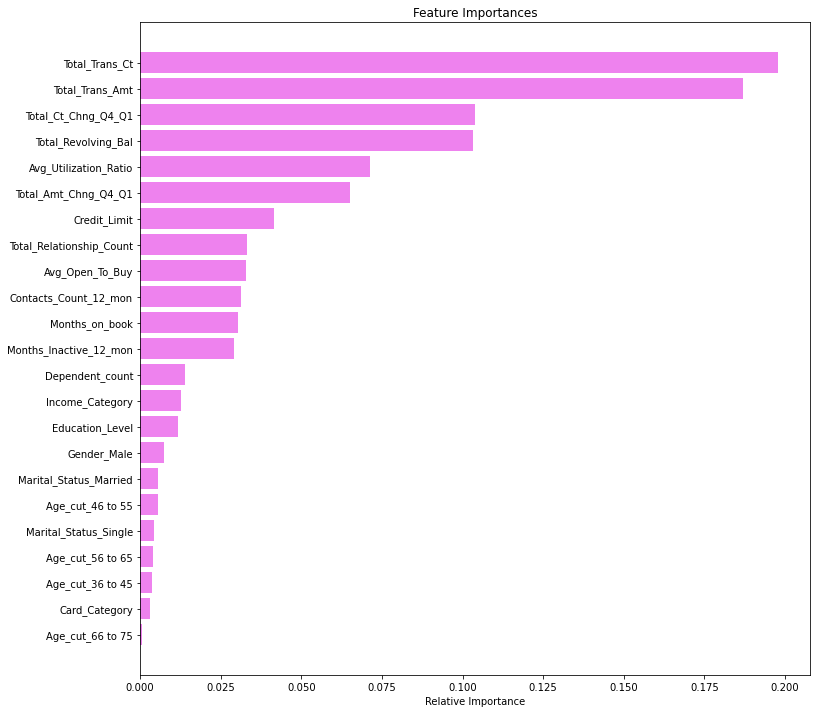

In [291]:
importances = rf2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Bagging using RandomUnderSampler

In [225]:
bg2=BaggingClassifier(random_state=1)
bg2.fit(X_train_un, y_train_un)

BaggingClassifier(random_state=1)

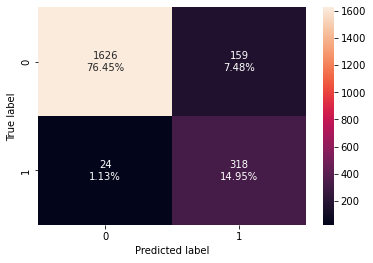

In [227]:
confusion_matrix_sklearn(bg2, X_val, y_val)

- Bagging with undersampled has performed poorer than with oversamples
- it has done better predicting the negatives

In [226]:
get_metrics_score(bg2)

Accuracy on training set :  0.9395283209030437
Accuracy on validation set :  0.9139633286318759
Recall on training set :  0.9937264742785445
Recall on validation set :  0.9298245614035088
Precision on training set :  0.7286108555657773
Precision on validation set :  0.6666666666666666
f1 on training set :  0.840764331210191
f1 on validation set :  0.7765567765567765


[0.9395283209030437,
 0.9139633286318759,
 0.9937264742785445,
 0.9298245614035088,
 0.7286108555657773,
 0.6666666666666666,
 0.840764331210191,
 0.7765567765567765]

# AdaBoosting using RandomUnderSampler

In [228]:
ab2=AdaBoostClassifier(random_state=1)
ab2.fit(X_train_un, y_train_un)

AdaBoostClassifier(random_state=1)

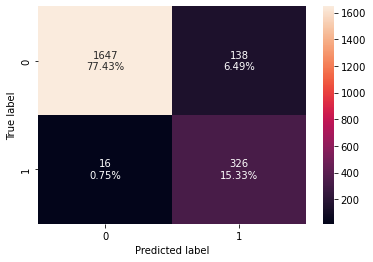

In [230]:
confusion_matrix_sklearn(ab2, X_val, y_val)

- Except precision it has done very well
- specially predicting the negative, almost 99 percent perfectly predicted

In [229]:
get_metrics_score(ab2)

Accuracy on training set :  0.9248135456561177
Accuracy on validation set :  0.9275975552421251
Recall on training set :  0.9598494353826851
Recall on validation set :  0.9532163742690059
Precision on training set :  0.6916817359855335
Precision on validation set :  0.7025862068965517
f1 on training set :  0.8039936941671045
f1 on validation set :  0.8089330024813897


[0.9248135456561177,
 0.9275975552421251,
 0.9598494353826851,
 0.9532163742690059,
 0.6916817359855335,
 0.7025862068965517,
 0.8039936941671045,
 0.8089330024813897]

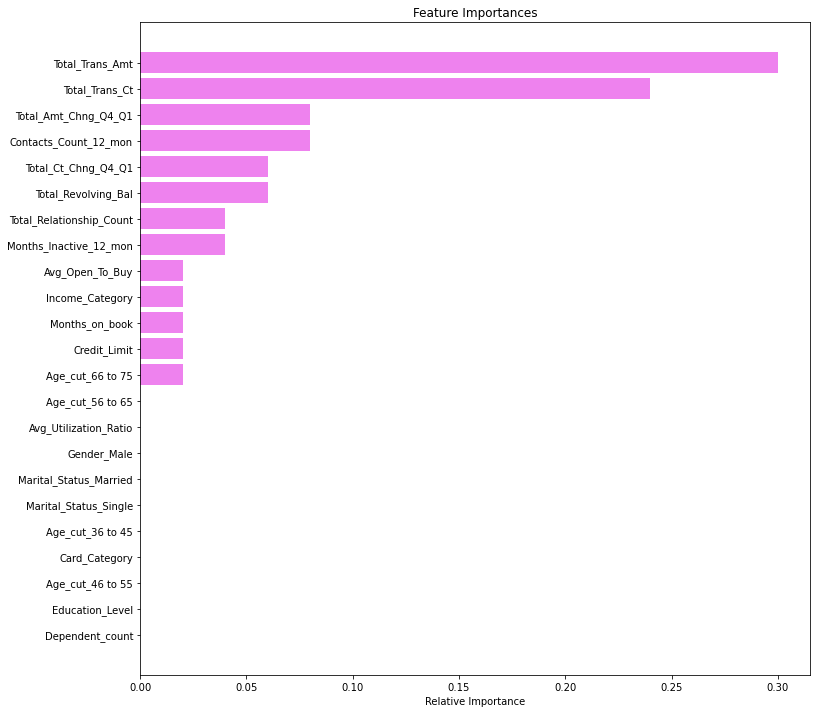

In [293]:
importances = ab2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# GradientBoosting using RandomUnderSampler

In [231]:
gb2=GradientBoostingClassifier(random_state=1)
gb2.fit(X_train_un, y_train_un)

GradientBoostingClassifier(random_state=1)

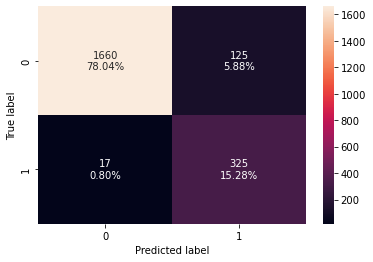

In [233]:
confusion_matrix_sklearn(gb2, X_val, y_val)

- this has also performed well, specially in prediction of negative

In [232]:
get_metrics_score(gb2)

Accuracy on training set :  0.9403346099576698
Accuracy on validation set :  0.9332393041842971
Recall on training set :  0.9874529485570891
Recall on validation set :  0.9502923976608187
Precision on training set :  0.7334575955265611
Precision on validation set :  0.7222222222222222
f1 on training set :  0.8417112299465241
f1 on validation set :  0.8207070707070707


[0.9403346099576698,
 0.9332393041842971,
 0.9874529485570891,
 0.9502923976608187,
 0.7334575955265611,
 0.7222222222222222,
 0.8417112299465241,
 0.8207070707070707]

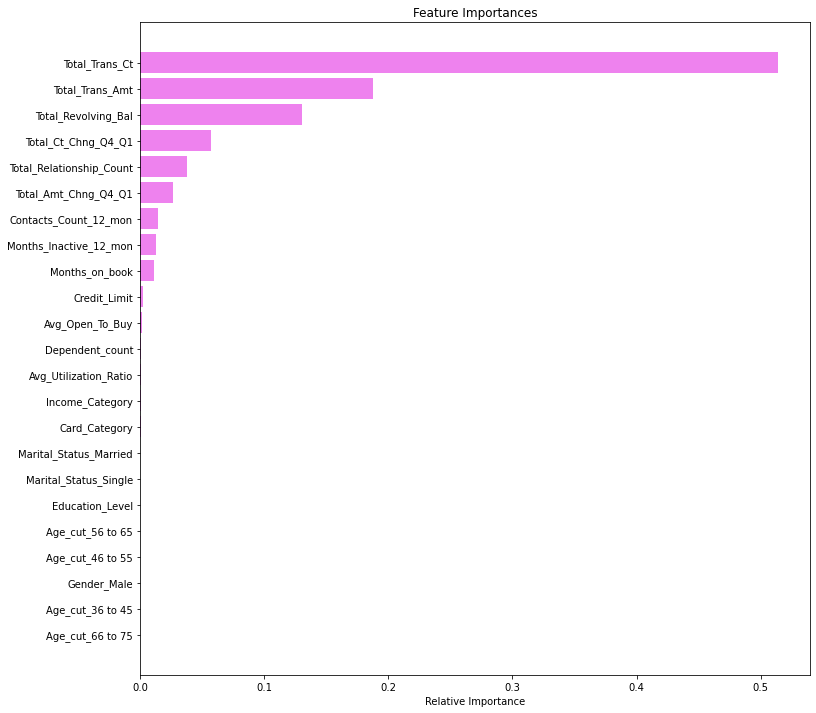

In [294]:
importances = gb2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

- In generall decision tree, random forest and bagging classifiers are performing poorly
- Ada boosting, Gradient boosting are performing well
- Total_tr_ct, Total_transection_amount, Total Relationship Count, Total revolving balance are important variables
- Thats why it is chosen to tune three models 

# Bagging Classifier Tuned

In [234]:
#Bagging classifier tuned
bg_tuned = BaggingClassifier(random_state=1)

parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1],
              'n_estimators' : [10,20,30,40,50],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Running the grid search
grid_obj = GridSearchCV(bg_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Setting the clf to the best combination of parameters
bagging_estimator_tuned = grid_obj.best_estimator_

# Fitting the best algorithm to the data.
bg_tuned.fit(X_train, y_train)

BaggingClassifier(random_state=1)

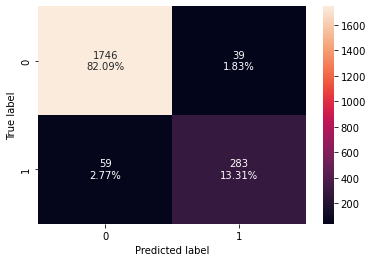

In [236]:
confusion_matrix_sklearn(bg_tuned, X_val, y_val)

In [235]:
get_metrics_score(bg_tuned)

Accuracy on training set :  0.9961701269905261
Accuracy on validation set :  0.9539257169722614
Recall on training set :  0.9799247176913425
Recall on validation set :  0.827485380116959
Precision on training set :  0.9961734693877551
Precision on validation set :  0.8788819875776398
f1 on training set :  0.9879822896900696
f1 on validation set :  0.8524096385542169


[0.9961701269905261,
 0.9539257169722614,
 0.9799247176913425,
 0.827485380116959,
 0.9961734693877551,
 0.8788819875776398,
 0.9879822896900696,
 0.8524096385542169]

In [237]:
# Choose the type of classifier. 
rf_tuned = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "class_weight": [{0: 0.3, 1: 0.7}],
    "n_estimators": [100,150,200,250],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": np.arange(0.2, 0.7, 0.1),
    "max_samples": np.arange(0.3, 0.7, 0.1),
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(rf_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_tuned.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 0.3, 1: 0.7},
                       max_features=0.6000000000000001,
                       max_samples=0.6000000000000001, min_samples_leaf=9,
                       n_estimators=250, random_state=1)

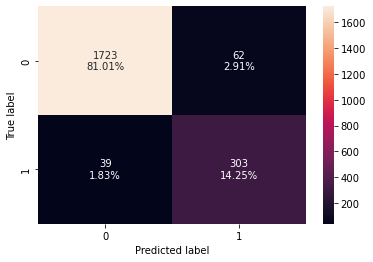

In [239]:
confusion_matrix_sklearn(rf_tuned, X_val, y_val)

In [238]:
get_metrics_score(rf_tuned)

Accuracy on training set :  0.9623059866962306
Accuracy on validation set :  0.9525152797367183
Recall on training set :  0.9146800501882058
Recall on validation set :  0.8859649122807017
Precision on training set :  0.8596698113207547
Precision on validation set :  0.8301369863013699
f1 on training set :  0.8863221884498479
f1 on validation set :  0.8571428571428572


[0.9623059866962306,
 0.9525152797367183,
 0.9146800501882058,
 0.8859649122807017,
 0.8596698113207547,
 0.8301369863013699,
 0.8863221884498479,
 0.8571428571428572]

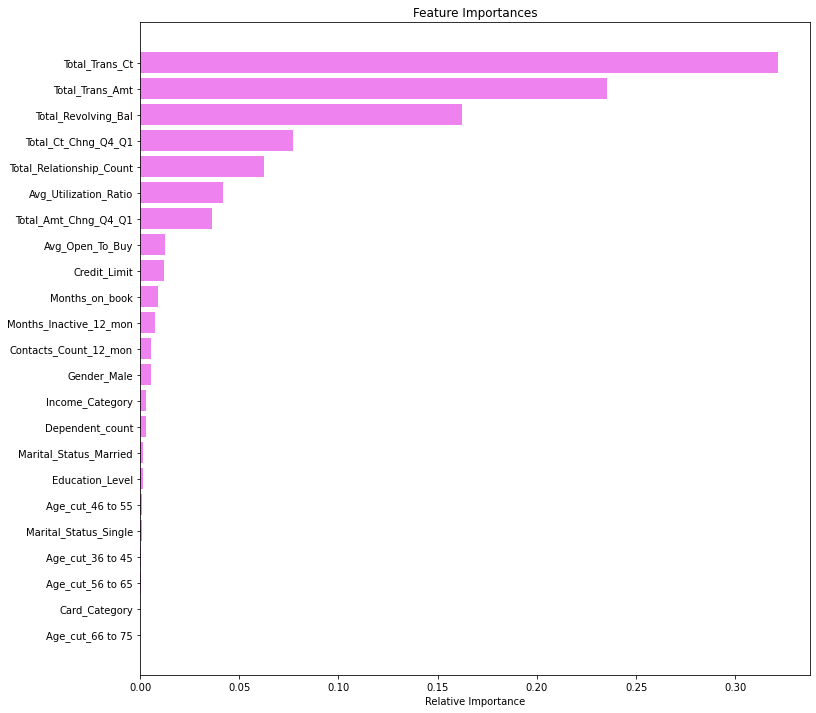

In [295]:
importances = rf_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Tuned Decision Tree Model

In [240]:
# Choose the type of classifier. 
dt_tuned = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': list(np.arange(2,20)) + [None], 
              'min_samples_leaf': [1, 3, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10, 15] + [None],
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(dt_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dt_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dt_tuned.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=8, min_samples_leaf=7, random_state=1)

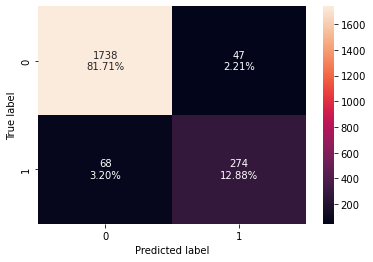

In [241]:
confusion_matrix_sklearn(dt_tuned, X_val, y_val)

In [242]:
get_metrics_score(dt_tuned)

Accuracy on training set :  0.967143721023987
Accuracy on validation set :  0.9459332393041843
Recall on training set :  0.8644918444165621
Recall on validation set :  0.8011695906432749
Precision on training set :  0.9260752688172043
Precision on validation set :  0.8535825545171339
f1 on training set :  0.8942245295262816
f1 on validation set :  0.8265460030165912


[0.967143721023987,
 0.9459332393041843,
 0.8644918444165621,
 0.8011695906432749,
 0.9260752688172043,
 0.8535825545171339,
 0.8942245295262816,
 0.8265460030165912]

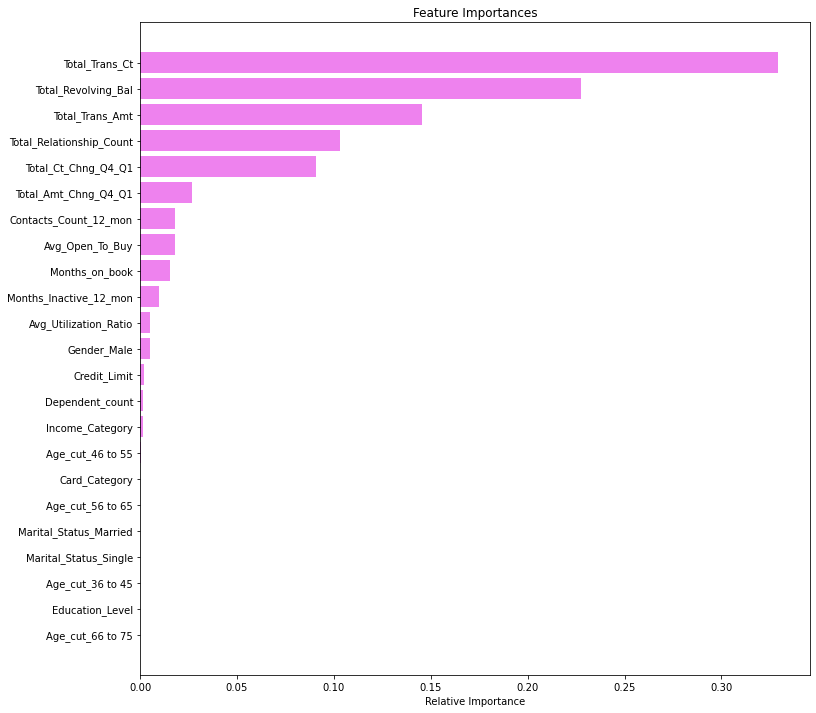

In [296]:
importances = dt_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# -Observations from the models after tuning
- all the three tuned models performed better than without tuned model
- the overfitting is reduced
- the gap between train and validation also reduced
- also performed comperatively better to identify the false negatives
- The imortant variables remained same like, total_tr_ct, Total_transection_amt etc.

# Hypertuning with Randomized Search CV

# Adaboost mit randomized 

In [244]:
# defining model
ad_hy = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=ad_hy, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 90, 'learning_rate': 1, 'base_estimator': DecisionTreeClassifier(max_depth=2, random_state=1)} with CV score=0.8532154088050314:


In [245]:
# building model with best parameters
ad_tuned2 = AdaBoostClassifier(
    n_estimators=90,
    learning_rate=1,
    random_state=1,
    base_estimator=DecisionTreeClassifier(max_depth=2, random_state=1),
)

# Fit the model on training data
ad_tuned2.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                         random_state=1),
                   learning_rate=1, n_estimators=90, random_state=1)

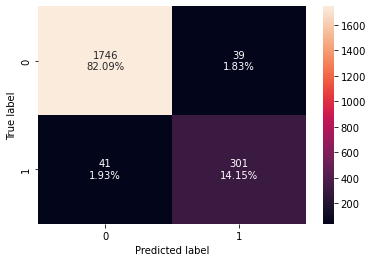

In [248]:
confusion_matrix_sklearn(ad_tuned2, X_val, y_val)

In [247]:
get_metrics_score(ad_tuned2)

Accuracy on training set :  0.9985889941544044
Accuracy on validation set :  0.9623883403855195
Recall on training set :  0.9962358845671268
Recall on validation set :  0.8801169590643275
Precision on training set :  0.9949874686716792
Precision on validation set :  0.8852941176470588
f1 on training set :  0.9956112852664577
f1 on validation set :  0.8826979472140762


[0.9985889941544044,
 0.9623883403855195,
 0.9962358845671268,
 0.8801169590643275,
 0.9949874686716792,
 0.8852941176470588,
 0.9956112852664577,
 0.8826979472140762]

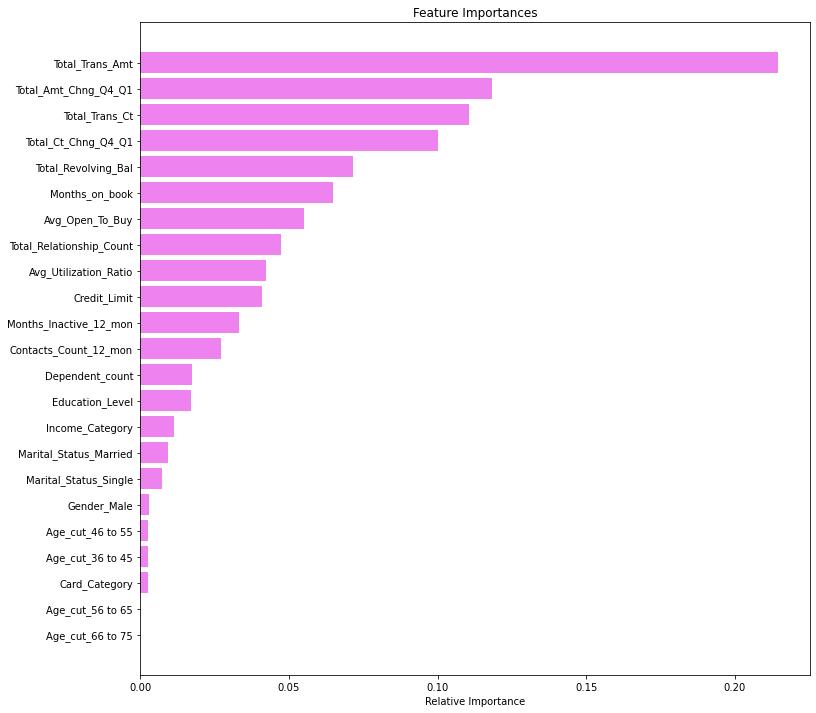

In [297]:
importances = ad_tuned2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Gradient Boosting with Randomized 

In [250]:
# defining model
gb_hy = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=gb_hy, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.2} with CV score=0.835691823899371:


In [251]:
# building model with best parameters
gb_tuned2 = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.2,
    random_state=1,
)

# Fit the model on training data
gb_tuned2.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.2, random_state=1)

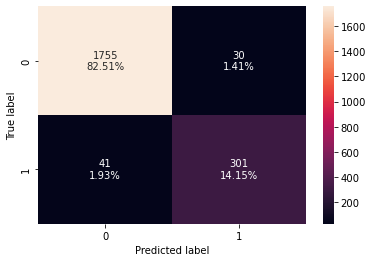

In [252]:
confusion_matrix_sklearn(gb_tuned2, X_val, y_val)

In [253]:
get_metrics_score(gb_tuned2)

Accuracy on training set :  0.9877040919169522
Accuracy on validation set :  0.9666196520921486
Recall on training set :  0.9435382685069009
Recall on validation set :  0.8801169590643275
Precision on training set :  0.9791666666666666
Precision on validation set :  0.9093655589123867
f1 on training set :  0.9610223642172524
f1 on validation set :  0.8945022288261515


[0.9877040919169522,
 0.9666196520921486,
 0.9435382685069009,
 0.8801169590643275,
 0.9791666666666666,
 0.9093655589123867,
 0.9610223642172524,
 0.8945022288261515]

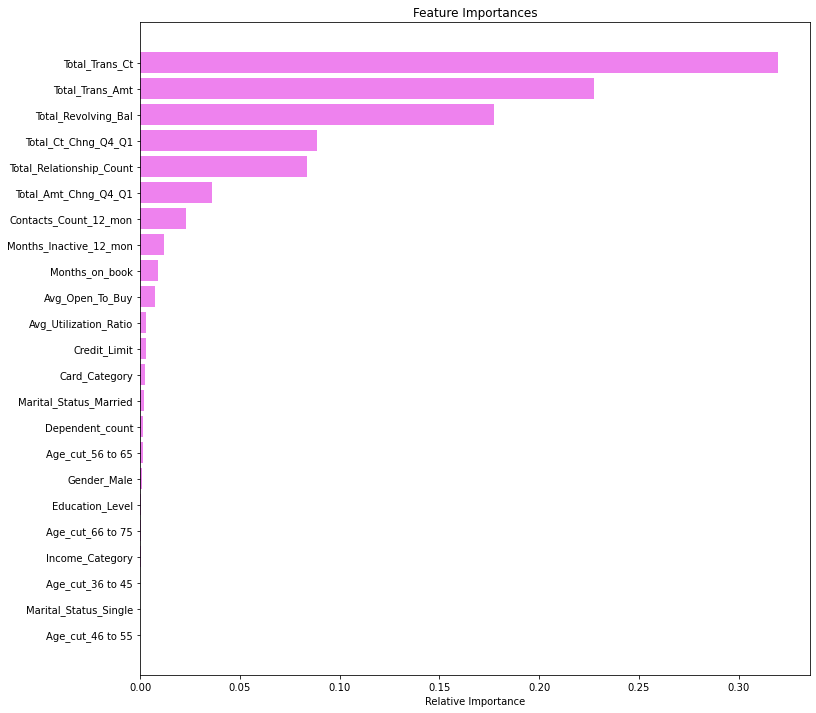

In [298]:
importances = gb_tuned2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Random Forest  with Randomized Search CV

In [255]:
# Choose the type of classifier. 
rf_hy = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [100,150,200,250],
    "max_features": np.arange(0.2, 0.7, 0.1),
    "max_samples": np.arange(0.3, 0.7, 0.1),
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=rf_hy, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

# Set the clf to the best combination of parameters
rf_hy = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_hy.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=8, min_samples_leaf=7, random_state=1)

In [256]:
# building model with best parameters
rf_tuned2 = RandomForestClassifier(
    max_depth=8,
    min_samples_leaf=7,
    random_state=1,
)

# Fit the model on training data
rf_tuned2.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=7, random_state=1)

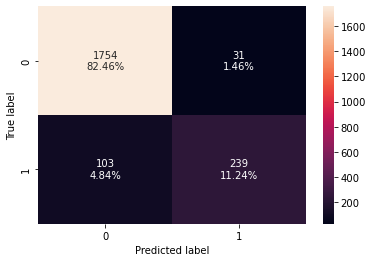

In [258]:
confusion_matrix_sklearn(rf_tuned2, X_val, y_val)

In [259]:
get_metrics_score(rf_tuned2)

Accuracy on training set :  0.9498085063495263
Accuracy on validation set :  0.9370004701457452
Recall on training set :  0.7377666248431619
Recall on validation set :  0.6988304093567251
Precision on training set :  0.9363057324840764
Precision on validation set :  0.8851851851851852
f1 on training set :  0.8252631578947369
f1 on validation set :  0.781045751633987


[0.9498085063495263,
 0.9370004701457452,
 0.7377666248431619,
 0.6988304093567251,
 0.9363057324840764,
 0.8851851851851852,
 0.8252631578947369,
 0.781045751633987]

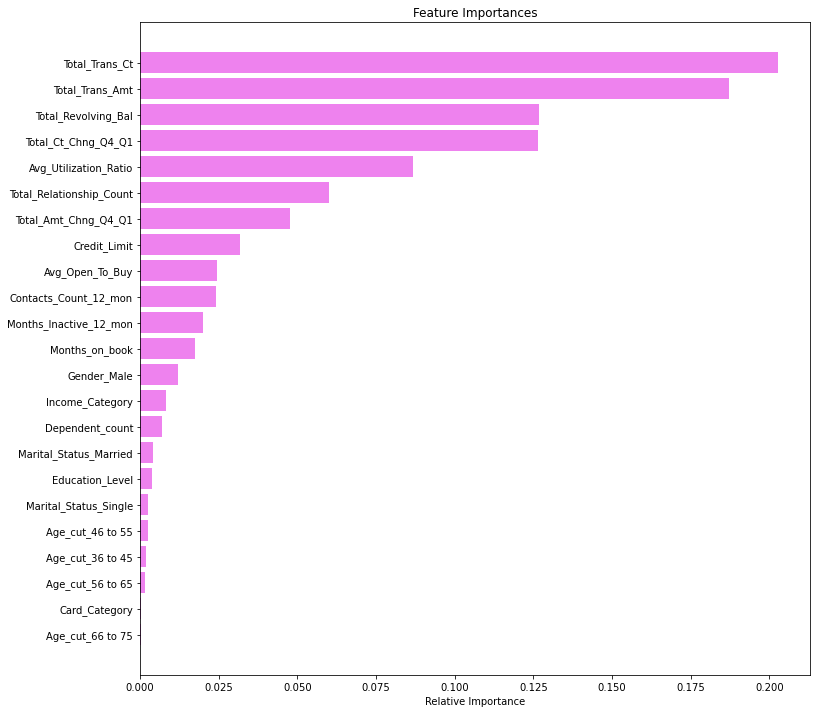

In [299]:
importances = rf_tuned2.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_val.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [262]:
# defining list of models
models = [ad_tuned2,rf_tuned2,gb_tuned2]

# defining empty lists to add train and test results
acc_train = []
acc_val = []
recall_train = []
recall_val = []
precision_train = []
precision_val = []
f1_train = []
f1_val = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_val.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_val.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_val.append(np.round(j[5],2))
    f1_train.append(np.round(j[6],2))
    f1_val.append(np.round(j[7],2))

In [264]:
comparison_frame = pd.DataFrame({'Model':['Adaboost with Randomized','Random Forest with randomized',
                                        'Gradient Boosting with Randomized'], 
                                          'Train_Accuracy': acc_train,'Val_Accuracy': acc_val,
                                          'Train_Recall':recall_train,'Val_Recall':recall_val,
                                          'Train_Precision':precision_train,'val_Precision':precision_val,
                                        'Train_f1':f1_train,'Test_f1':f1_val})
comparison_frame

,Model,Train_Accuracy,Val_Accuracy,Train_Recall,Val_Recall,Train_Precision,val_Precision,Train_f1,Test_f1
0,Adaboost with Randomized,1.00,0.96,1.00,0.88,0.99,0.89,1.00,0.88
1,Random Forest with randomized,0.95,0.94,0.74,0.70,0.94,0.89,0.83,0.78
2,Gradient Boosting with Randomized,0.99,0.97,0.94,0.88,0.98,0.91,0.96,0.89


# - After comparing the models, the best model is gradient boosting model 

# Make Pipeline

In [270]:
pipe=make_pipeline(StandardScaler(), GradientBoostingClassifier())

In [271]:
pipe.steps

[('standardscaler', StandardScaler()),
 ('gradientboostingclassifier', GradientBoostingClassifier())]

In [272]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingclassifier', GradientBoostingClassifier())])

In [273]:
pipe.score(X_train, y_train)

0.9746018947792784

In [276]:
pipe.score(X_test, y_test)

0.9608423823626193

# Observations and Findings
- Demographich varaibles like age, gender, marital status, Income level has no or significant impact on the behavior of customer, whether customer will stay or not
- Total_Revolving_Bal, Avg_Open_To_Buy, Total_Trans_Amt, Total_Trans_Ct these are the variables which can define the target variable mostly. 
- Many features are suffering from outliers, like in Credit_limit, Avg_open_to_buy, Total_trans_amt-Total trans_ct
- Platinum customers are leaving. That might be indication of dissatisfaction with the bank and their service. They should improve their service to retain the customer
- Bank might be targeting the wrong segment of customer. They are targeting the customer, who are not right segement for their business and designing the service accordingly
- Bank should target those segment, which are visionary people with dream and they put effort for achieving something, and thus they will go to bank and take loan and use the credit card
- Number of contacts between bank and cusotmer is also a important factor. Because the number of contact with customer should be increased, and at the same, quality contact should be ensured

In [1]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install yellowbrick

  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.3
    Uninstalling numpy-1.20.3:
      Successfully uninstalled numpy-1.20.3
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.3.0 requires daal==2021.2.3, which is not installed.
